feature visualization notebook

Goal of this notebook is to chekc if important concepts in the model trained on real data highligth the same visual input pixels in the the fake datasets (see the other notebook for the resposnse on the real dataset)

imports


In [1]:
import torch.nn.functional as F
from pytorch_lightning import LightningModule
from torch import nn
from torchmetrics.functional import accuracy
from torchvision.models import resnet50
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch
import torchvision
from torchvision.models.resnet import resnet50
import torchvision.transforms as T
from PIL import Image
from zennit.canonizers import SequentialMergeBatchNorm
from zennit.composites import EpsilonPlusFlat
from itertools import islice

import torch
from torch.nn import Linear
from PIL import Image
from torchvision.transforms import Compose, Resize, CenterCrop
from torchvision.transforms import ToTensor, Normalize
from torchvision.models import vgg11_bn, vgg11, resnet18

from zennit.attribution import Gradient, SmoothGrad
#from zennit.core import Stabilizer
from zennit.composites import EpsilonGammaBox, EpsilonPlusFlat
from zennit.composites import SpecialFirstLayerMapComposite, NameMapComposite
from zennit.image import imgify, imsave
from zennit.rules import Epsilon, ZPlus, ZBox, Norm, Pass, Flat
from zennit.types import Convolution, Activation, AvgPool, Linear as AnyLinear
#from zennit.types import BatchNorm, MaxPool
from zennit.torchvision import VGGCanonizer, ResNetCanonizer
import torchvision
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.attribution import CondAttribution
from crp.visualization import FeatureVisualization
from crp.image import plot_grid
from crp.image import vis_opaque_img

/data/mpozzi/py_env/diffusion_env/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device

In [2]:
import torch
device = "cuda:1" if torch.cuda.is_available() else "cpu"

load model

In [3]:
class res50(LightningModule):
    def __init__(self, num_classes, learning_rate=2e-4,tmax = 20):

        super().__init__()

        self.num_classes = num_classes
        self.learning_rate = learning_rate
        self.save_hyperparameters()
        self.resnet_model = resnet50()
        linear_size = list(self.resnet_model.children())[-1].in_features
        self.resnet_model.fc = nn.Linear(linear_size, num_classes)
        self.loss_function = nn.CrossEntropyLoss()
        self.tmax = tmax

    

    def forward(self, x):
        x = self.resnet_model(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x)
        y_hat = torch.argmax(preds, dim=1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("Training_acc", acc, on_epoch=True, prog_bar=True,on_step=False)

        loss = self.loss_function(preds, y)
        self.log('Training_loss',loss.item(),prog_bar= True,on_step=True,on_epoch=True)
        return loss 

    def validation_step(self, batch, batch_idx):
        x, y = batch
        preds = self.resnet_model(x)
        loss = self.loss_function(preds, y) 
        y_hat = torch.argmax(preds, dim=1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("val_loss", loss.item(), prog_bar= False,on_epoch=True)
        self.log("val_acc", acc, on_epoch=True, prog_bar=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        preds = self.resnet_model(x)
        loss = self.loss_function(preds, y) 
        y_hat = torch.argmax(preds, dim=1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("test_loss", loss.item(), prog_bar= False,on_epoch=True)
        self.log("test_acc", acc, on_epoch=True, prog_bar=True)

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.learning_rate)
        scheduler = CosineAnnealingLR(optimizer,T_max=self.tmax)
        return {
        "optimizer": optimizer,
        "lr_scheduler": {
            "scheduler": scheduler,
            "interval": 'epoch',
            "frequency": 1
            # If "monitor" references validation metrics, then "frequency" should be set to a
            # multiple of "trainer.check_val_every_n_epoch".
        }
    }



class VIT_model(LightningModule):
    def __init__(self,image_size,patch_size,num_classes,dim,depth,heads,mlp_dim,tmax = 20,learning_rate=2e-4):
        super().__init__()
        self.image_size = image_size
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.dim = dim 
        self.depth = depth
        self.heads = heads
        self.mlp_dim = mlp_dim
        self.learning_rate = learning_rate
        self.loss_function = nn.CrossEntropyLoss()
        self.tmax = tmax
        self.vit_model = SimpleViT(image_size=  self.image_size,
                            patch_size = self.patch_size,
                            num_classes = self.num_classes,
                            dim = self.dim,
                            depth = self.depth,
                            heads = self.heads,
                            mlp_dim = self.mlp_dim)
        self.save_hyperparameters()
    def forward(self, x):
        out = self.vit_model(x)
        return out

    def training_step(self, batch, batch_idx):
        x, y = batch
        preds = self.forward(x)
        y_hat = torch.argmax(preds, dim=-1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("Training_acc", acc, on_epoch=True, prog_bar=True,on_step=False)

        loss = self.loss_function(preds, y)
        self.log('Training_loss',loss.item(),prog_bar= True,on_step=True,on_epoch=True)
        return loss 

    def validation_step(self, batch, batch_idx):
        x, y = batch
        preds = self.forward(x)
        loss = self.loss_function(preds, y) 
        y_hat = torch.argmax(preds, dim=-1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("val_loss", loss.item(), prog_bar= False,on_epoch=True)
        self.log("val_acc", acc, on_epoch=True, prog_bar=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        preds = self.forward(x)
        loss = self.loss_function(preds, y) 
        y_hat = torch.argmax(preds, dim=-1)
        task_type = "multiclass" if self.num_classes > 2 else "binary"
        acc = accuracy(y_hat, y,task_type,num_classes=self.num_classes)
        self.log("test_loss", loss.item(), prog_bar= False,on_epoch=True)
        self.log("test_acc", acc, on_epoch=True, prog_bar=True)

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.learning_rate)
        scheduler = CosineAnnealingLR(optimizer,T_max=self.tmax)
        return {
        "optimizer": optimizer,
        "lr_scheduler": {
            "scheduler": scheduler,
            "interval": 'epoch',
            "frequency": 1
            # If "monitor" references validation metrics, then "frequency" should be set to a
            # multiple of "trainer.check_val_every_n_epoch".
        }
    }

model = res50.load_from_checkpoint('/home/mpozzi/pesi_res50_real/epoch=79-step=83680.ckpt', map_location=device)
model = model.resnet_model
model.eval()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

data

In [4]:
# separate normalization from resizing for plotting purposes later
transform = T.Compose([T.Resize(256), T.CenterCrop(224), T.ToTensor()])
preprocessing =  T.Normalize(mean=[0.7358, 0.4814, 0.6079], std=[0.1044, 0.1355, 0.1108]) # from shahry

data = torchvision.datasets.ImageFolder('/data4/erobbi/tiles_thres',transform=transform)

In [5]:
# use the ResNet-specific canonizer
canonizer = ResNetCanonizer()

# create a composite, specifying the canonizers
composite = EpsilonPlusFlat(canonizers=[canonizer])

# instantiate ChannelConcept object
cc = ChannelConcept()

# get networks layer names
layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
layer_map = {layer : cc for layer in layer_names}

attribution = CondAttribution(model)

In [6]:
fv_path = "XAI_ResNet50_DP_realModel_RealData"
fv = FeatureVisualization(attribution, data, layer_map, preprocess_fn=preprocessing, path=fv_path)

In [7]:
#saved_files = fv.run(composite, 0, len(data), 16, 100, on_device=device)

Running Analysis...


100%|██████████| 3509/3509 [56:14<00:00,  1.04it/s] 


100%|██████████| 2160/2160 [00:17<00:00, 120.59it/s]


in the previus notebook, tun on colab, we saw that for the classification of lung the 5 most important conept in the last conv layer `layer4.2.conv3` were: tensor([1411, 1952,  827,  767, 1247]) witch relevance: [0.2750, 0.2552, 0.2452, 0.2393, 0.2354].
now we visualize which are the 8 most representative input samples for each of these concepts using `Relevance Maximization`

let's try to change the canonizer

In [7]:
canonizers = [SequentialMergeBatchNorm()]
composite = EpsilonPlusFlat(canonizers)

interesting concept and layer explored on the colab looking at the **class Lung**:

In [8]:
ref_c = fv.get_max_reference([1432, 1235, 1839,  281,  226], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

#plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(50, 50), dpi = 300)
ref_c[1432][4].save("/data/mpozzi/diffusion/images_poster&paper/prova1.png", dpi = (700,700))

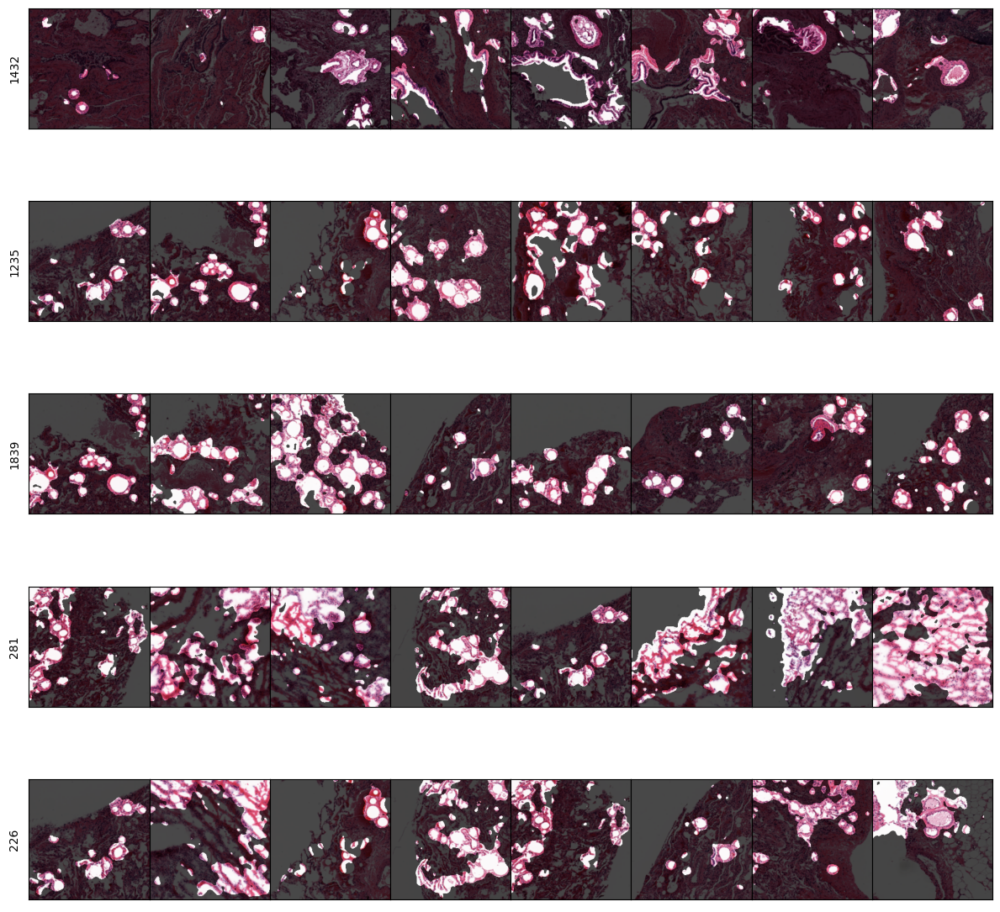

In [9]:
ref_c = fv.get_max_reference([1432, 1235, 1839,  281,  226], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

In [10]:
for i in range(4):
    ref_c[1235][i].save(f"/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_lung_img{i}_chann1235.png", dpi = (600,600))

interesting concept and layer explored on the colab looking at the class **brain**: indeed the most actevated images for each concepts are all lungs

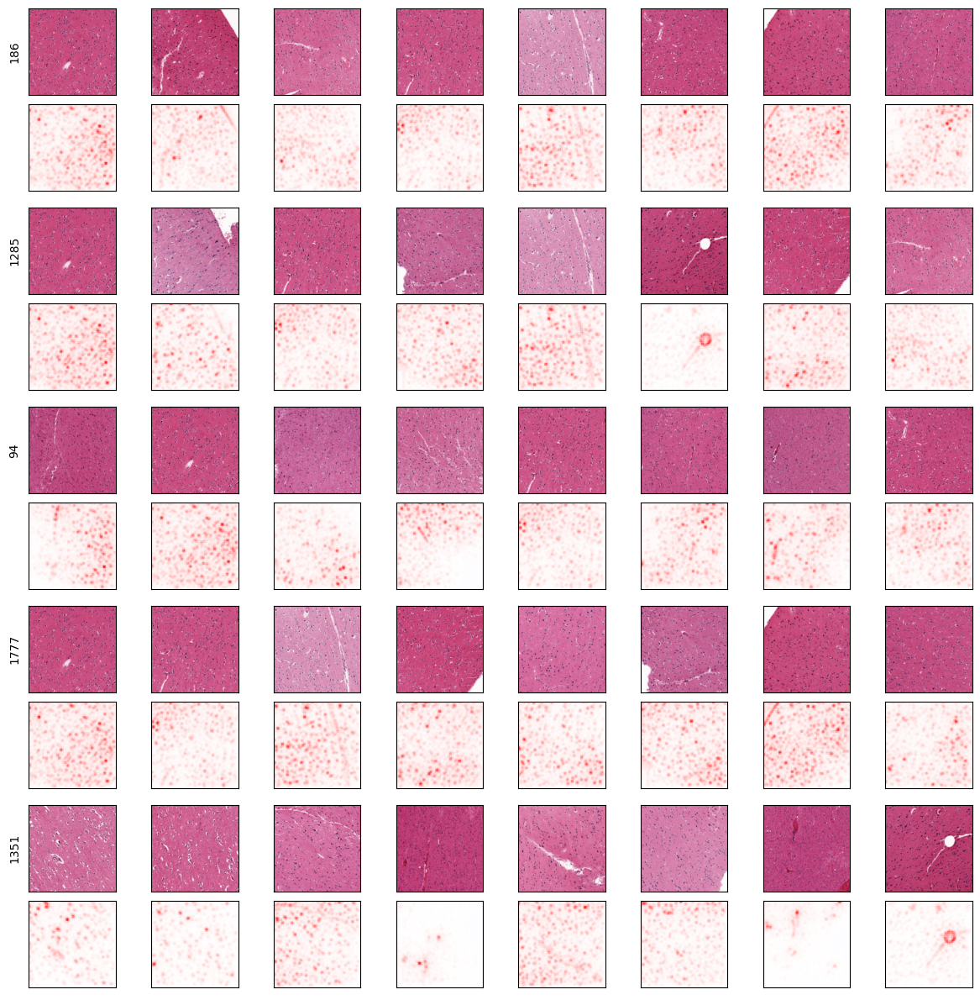

In [10]:
ref_c = fv.get_max_reference([186, 1285,   94, 1777, 1351], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=None)

plot_grid(ref_c, figsize=(12, 12))

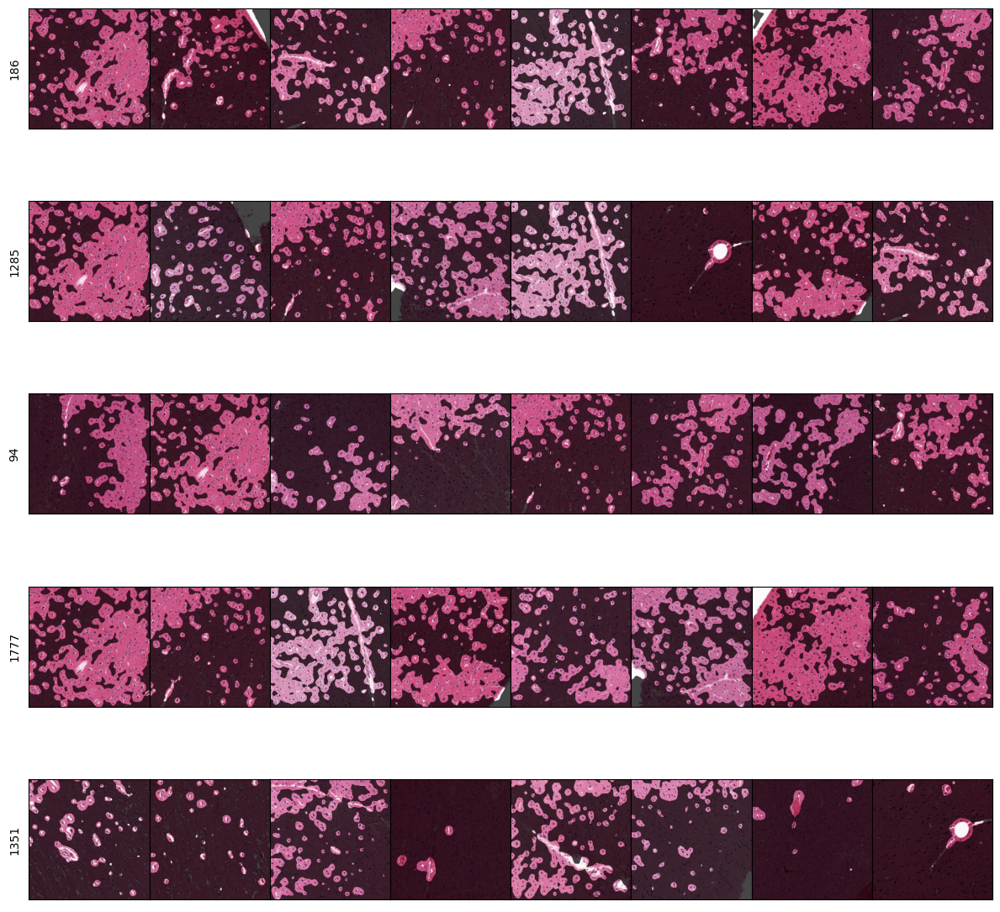

In [11]:
ref_c = fv.get_max_reference([186, 1285,   94, 1777, 1351], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))


In [12]:
for i in range(4):
    ref_c[186][i].save(f"/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_brain_img{i}_chann186.png", dpi = (600,600))

interesting concept and layer explored on the colab looking at the class **kidney**: most of them kidney, especially in the first concept

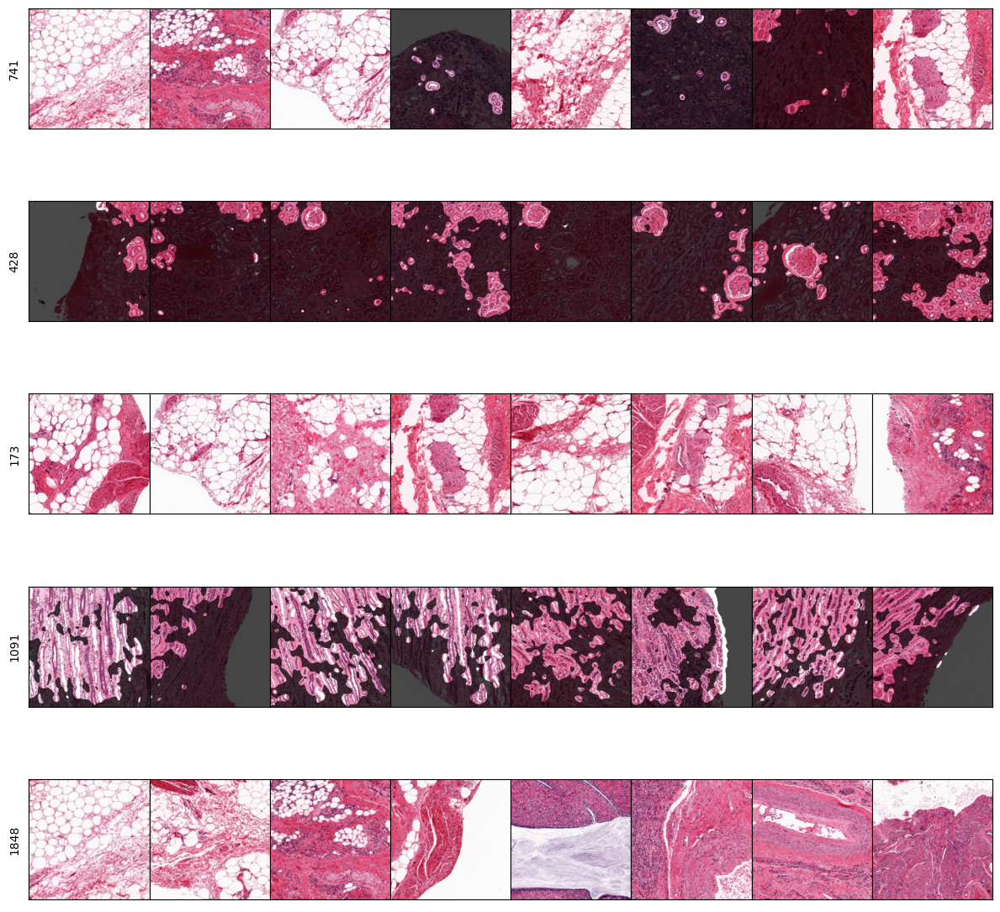

In [12]:
ref_c = fv.get_max_reference([741,  428,  173, 1091, 1848], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

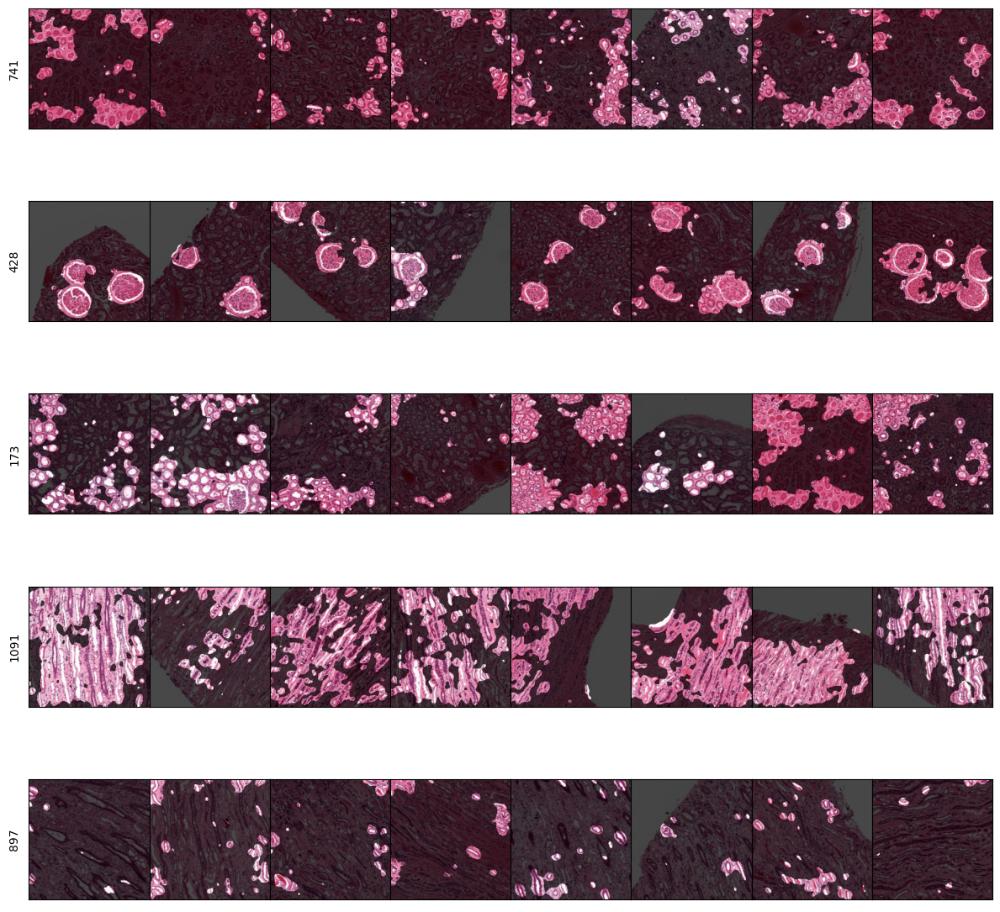

In [13]:
ref_c = fv.get_max_reference([741,  428,  173, 1091,  897], 'layer4.0.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

save 4 images and activation from channels 428

In [14]:
for i in range(4):
    ref_c[428][i].save(f"/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_kidney_img{i}_chann428.png", dpi = (600,600))

for **pancreas**

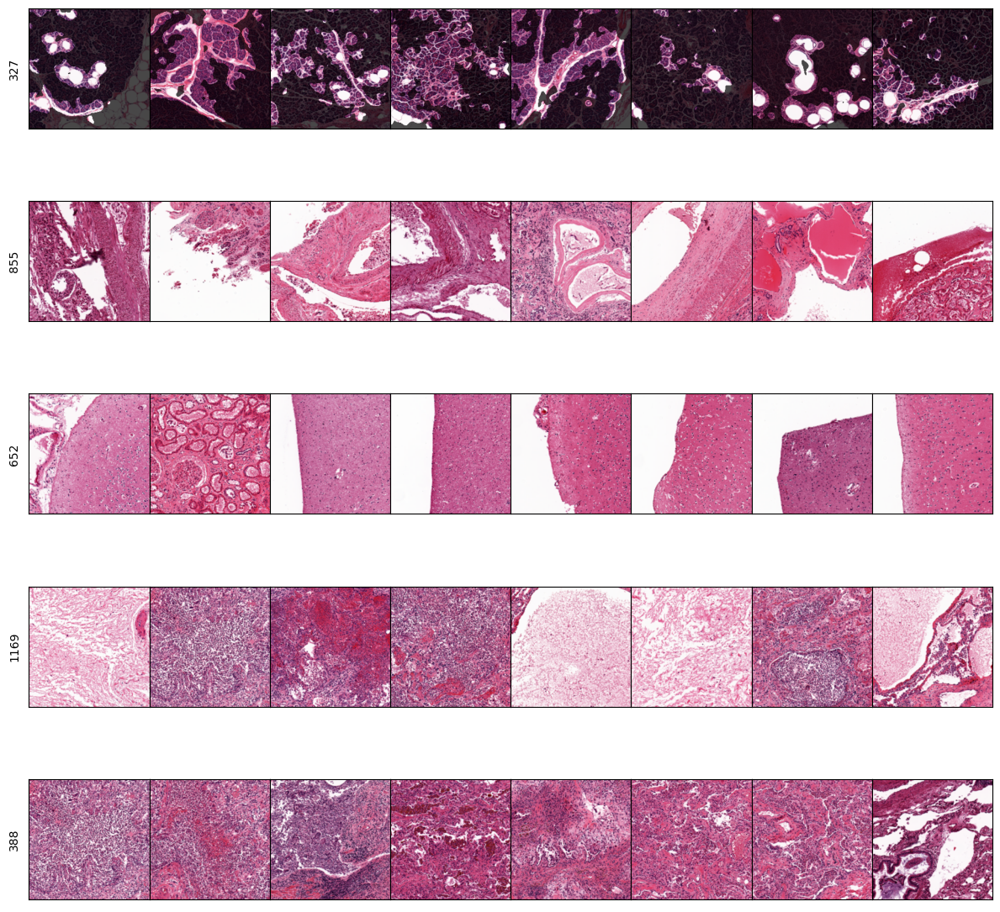

In [14]:
ref_c = fv.get_max_reference([327,  855,  652, 1169,  388], 'layer4.2.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

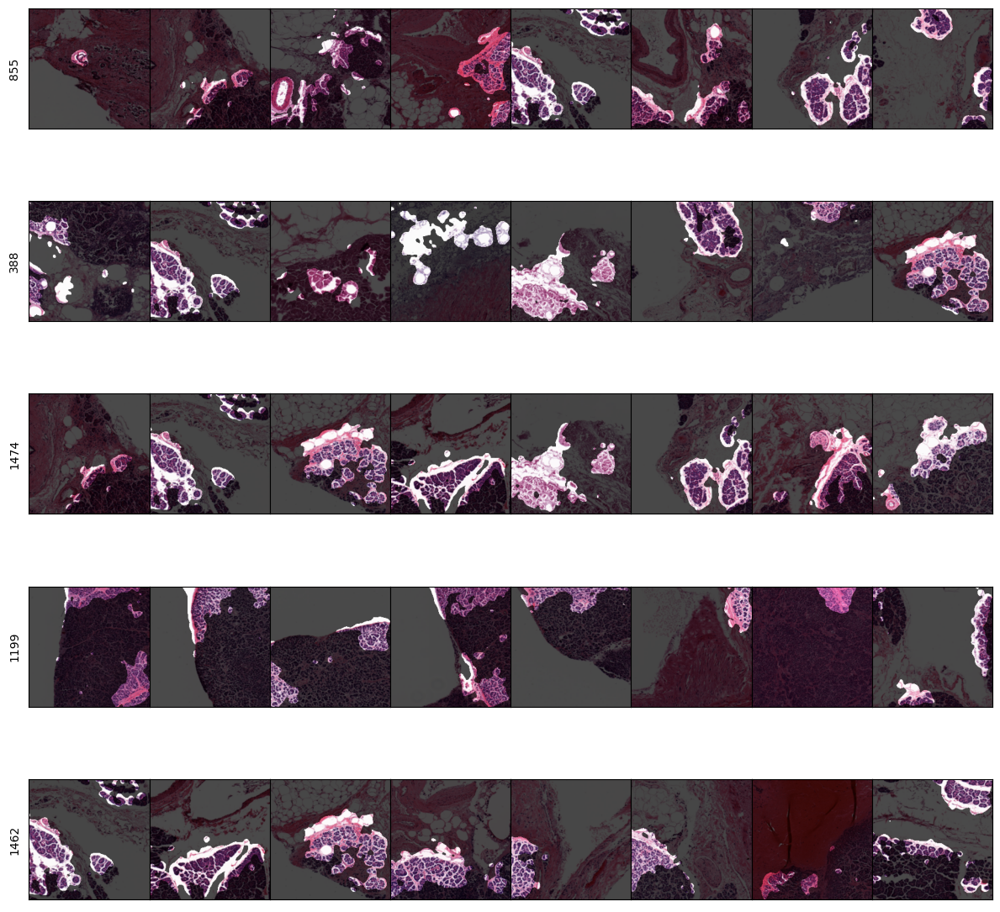

In [15]:
ref_c = fv.get_max_reference([855,  388, 1474, 1199, 1462], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

In [16]:
for i in range(4):
    ref_c[388][i].save(f"/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_pancreas_img{i}_chann388.png", dpi = (600,600))

**uterus**

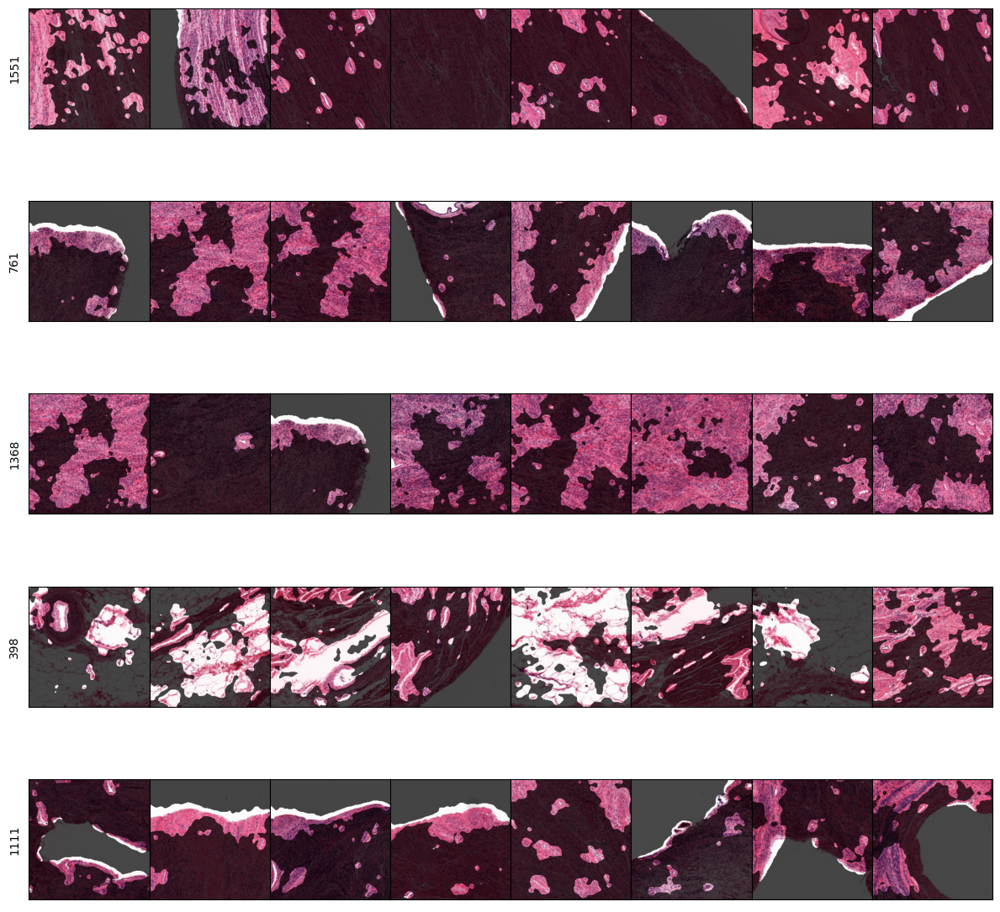

In [17]:
ref_c = fv.get_max_reference([1551,  761, 1368,  398, 1111], 'layer4.0.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

In [18]:
for i in range(4):
    ref_c[1368][i].save(f"/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_uterus_img{i}_chann1368.png", dpi = (600,600))

# channels and classes

The method compute_stats returns the most representative classes i.e. targets and their mean values. If you set the norm parameter, the values are normed wrt. the maximal value. Use the top_N parameter to return the top-N targets.

If you did not run the analysis on your own, you can only visualize the example below. Providing files for alle concepts and layers consumes too much disk space.

Brain

In [17]:
targets_brain, rel_brain = fv.compute_stats(186, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_brain, rel_brain 

(array([0, 2, 3, 4, 1]), tensor([1.0000, 0.2292, 0.1770, 0.1312, 0.0580]))

Kidney

In [18]:
targets_kidney, rel_kidney = fv.compute_stats(428, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_kidney, rel_kidney 

(array([1, 2, 0, 4, 3]), tensor([1.0000, 0.2170, 0.2093, 0.0365, 0.0261]))

Lung

In [19]:
targets_lung, rel_lung = fv.compute_stats(281, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_lung, rel_lung 

(array([2, 4, 0, 3, 1]), tensor([1.0000, 0.3683, 0.1463, 0.1294, 0.0854]))

Pancreas

In [20]:
targets_pancreas, rel_pancreas = fv.compute_stats(327, "layer4.2.conv3", "relevance", top_N=5, norm=True)
targets_pancreas, rel_pancreas 

(array([3, 0, 1, 2, 4]), tensor([1.0000, 0.6162, 0.4958, 0.2396, 0.0541]))

In [21]:
targets_pancreas, rel_pancreas = fv.compute_stats(855, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_pancreas, rel_pancreas 

(array([3, 1, 4, 0, 2]), tensor([1.0000, 0.3492, 0.2901, 0.2016, 0.1597]))

Uterus

In [22]:
targets_uterus, rel_uterus = fv.compute_stats(761, "layer4.0.conv3", "relevance", top_N=5, norm=True)
targets_uterus, rel_uterus 

(array([4, 1, 0, 3, 2]), tensor([1.0000, 0.0230, 0.0149, 0.0147, 0.0071]))

In [ ]:
ref_t = fv.get_stats_reference(200, "layer4.2.conv1", targets, "relevance", (0, 8), rf=False, composite=composite)

plot_grid(ref_t, figsize=(12, 12), padding=False)

In [ ]:
ref_t = fv.get_stats_reference(1411, "layer4.2.conv3", targets, "relevance", (0, 8), rf=False, composite=composite, )

plot_grid(ref_t, figsize=(12, 12), padding=False)

In [11]:
targets_uterus, rel_uterus = fv.compute_stats(1517, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_uterus, rel_uterus 

(array([3, 1, 0, 2, 4]), tensor([1.0000, 0.6356, 0.5779, 0.4601, 0.4249]))

In [12]:
targets_uterus, rel_uterus = fv.compute_stats(1551, "layer4.1.conv3", "relevance", top_N=5, norm=True)
targets_uterus, rel_uterus 

(array([4, 0, 3, 2, 1]), tensor([1.0000, 0.1472, 0.0904, 0.0825, 0.0682]))

## complete panel for paper

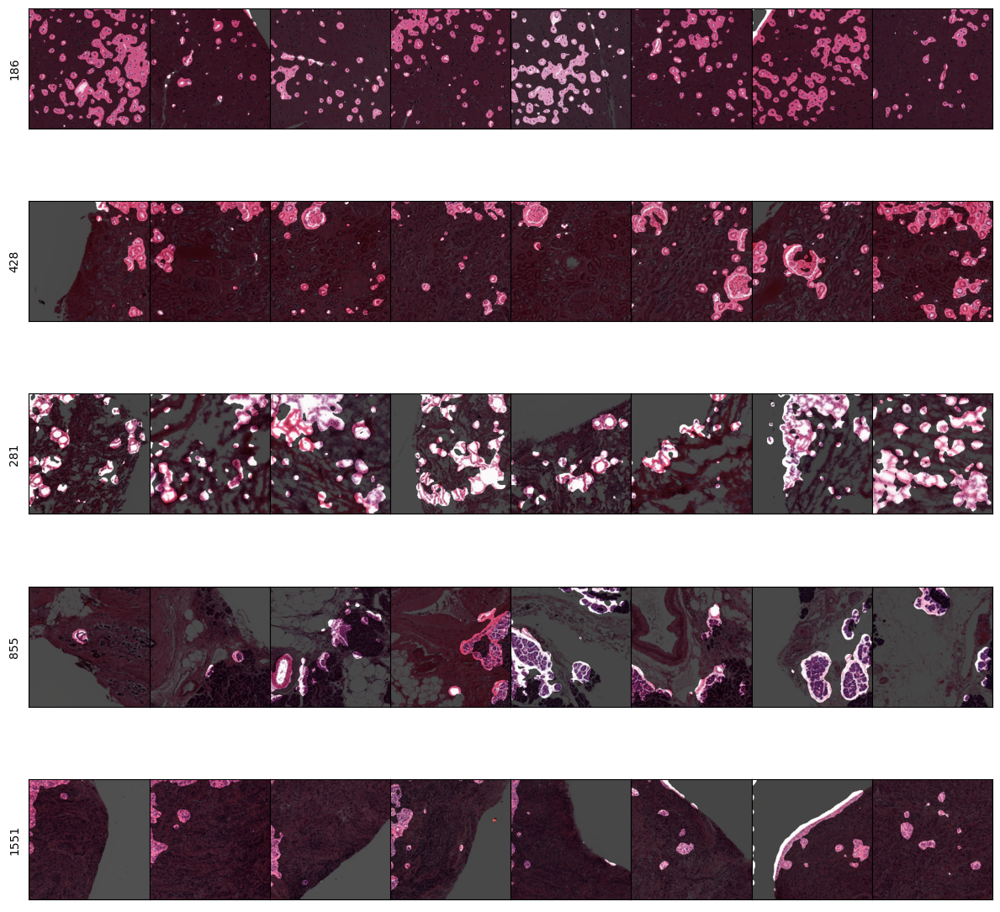

In [9]:
ref_c = fv.get_max_reference([186,  428, 281, 855, 1551], 'layer4.1.conv3', "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

figure = plot_grid(ref_c,cmap="bwr", symmetric=True, figsize=(12, 12))

In [10]:
figure.savefig('/data/mpozzi/diffusion/images_poster&paper/XAI_realModel_realData_panel.svg', format='svg',)